<a href="https://colab.research.google.com/github/frontloss/Exoplanets-habitability-and-sustainability-prediction-using-machine-learning/blob/main/Exoplanet_Habitability_and_Sustainability_Prediction_using_Machine_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Habitability of Exoplanets :

The website ["Planetary Habitability Laboratory"](http://phl.upr.edu/) is very informative for keeping oneself updated about the habitable planets. In this project, we have used their latest [catalog](https://phl.upr.edu/projects/habitable-exoplanets-catalog/hec-data-of-potentially-habitable-worlds/phls-exoplanets-catalog). The provided link has all data field descriptions in details.

The target variable is **"P_HABITABLE"** which is having values 0 (inhabitable) or 1 (conservatively habitable) or 2 (optimistically habitable). Initially, we will also explore which interesting features are responsible for making an exoplanet (a planet outside our solar system) habitable. Then we will divide the data set into 80% training data and 20% testing data in order to judge performance of different classification models.

In the end, we also experimented with unsupervised learning after removing the labels and checked whether it is really giving rise to three distinct clusters of planets or not.

**DATA ACKNOWLEDGEMENT: PHL's Exoplanet Catalog of the Planetary Habitability Laboratory @ UPR Arecibo.**

In [ ]:
# Importing data
import pandas as pd
full_data = pd.read_csv('phl_exoplanet_catalog.csv')

In [ ]:
full_data.head()

,P_NAME,P_MASS,P_MASS_ERROR_MIN,P_MASS_ERROR_MAX,P_RADIUS,P_RADIUS_ERROR_MIN,P_RADIUS_ERROR_MAX,P_YEAR,P_UPDATED,P_PERIOD,...,S_ABIO_ZONE,S_TIDAL_LOCK,P_HABZONE_OPT,P_HABZONE_CON,P_TYPE_TEMP,P_HABITABLE,P_ESI,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG
0,11 Com b,6165.86330,-476.74200,476.74200,12.1068,NaN,NaN,2007.0,2008-01,326.03000,...,0.476460,0.642400,0,0,Hot,0,0.083004,Coma Berenices,Com,Berenice's Hair
1,11 UMi b,4684.78480,-794.57001,794.57001,12.2189,NaN,NaN,2009.0,2009-10,516.21997,...,0.193891,0.541702,0,0,Hot,0,0.081792,Ursa Minor,UMi,Little Bear
2,14 And b,1525.57440,NaN,NaN,12.8915,NaN,NaN,2008.0,2008-12,185.84000,...,0.502752,0.597816,0,0,Hot,0,0.081758,Andromeda,And,Andromeda
3,14 Her b,2586.74170,-308.97014,492.67154,12.5552,NaN,NaN,2002.0,2003-01,1765.03890,...,0.923150,0.434927,0,0,Cold,0,0.163310,Hercules,Her,Hercules
4,16 Cyg B b,565.73385,-25.42624,25.42624,13.4520,NaN,NaN,1996.0,1997-07,798.50000,...,1.983658,0.512355,1,1,Warm,0,0.368405,Cygnus,Cyg,Swan


In [ ]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5220 entries, 0 to 5219
Columns: 103 entries, P_NAME to S_CONSTELLATION_ENG
dtypes: float64(86), int64(3), object(14)
memory usage: 4.1+ MB


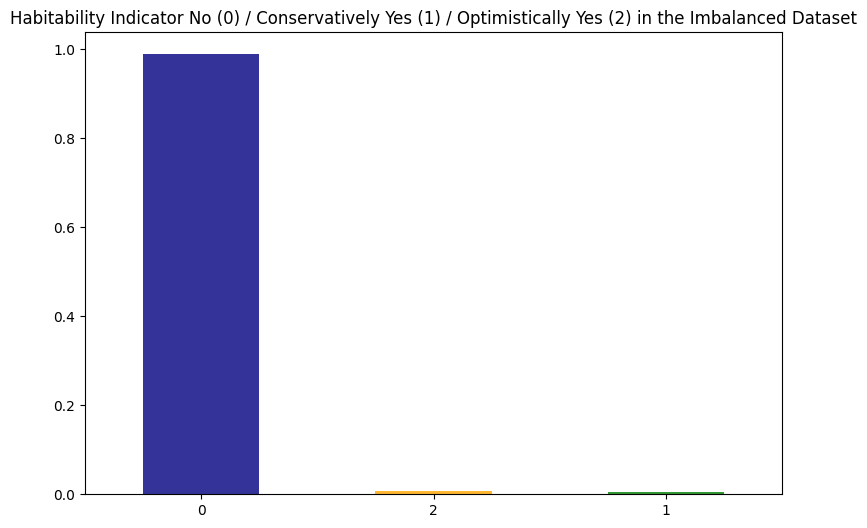

In [ ]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (9,6))
full_data.P_HABITABLE.value_counts(normalize = True, ascending = False).plot(kind='bar', color= ['navy','orange','green'], alpha = 0.8, rot=0)
plt.title('Habitability Indicator No (0) / Conservatively Yes (1) / Optimistically Yes (2) in the Imbalanced Dataset')
plt.show()

In [ ]:
full_data['P_HABITABLE'].value_counts(normalize=True)

0    0.988314
2    0.007471
1    0.004215
Name: P_HABITABLE, dtype: float64

* **Initial Exploration with DABL Library**

In [ ]:
!pip install dabl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 564.3/564.3 kB 9.2 MB/s eta 0:00:00


In [ ]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function() {
    return False;
}

<IPython.core.display.Javascript object>

Target looks like classification
Showing only top 10 of 86 continuous features
Linear Discriminant Analysis training set score: 0.823


[<Axes: title={'center': 'Target distribution'}, xlabel='count', ylabel='P_HABITABLE'>,
 [<Figure size 2000x600 with 10 Axes>,
  array([[<Axes: title={'center': '0.858'}, xlabel='P_ESI', ylabel='P_TEMP_SURF'>,
          <Axes: title={'center': '0.840'}, xlabel='P_ESI', ylabel='P_TEMP_EQUIL'>,
          <Axes: title={'center': '0.767'}, xlabel='P_TEMP_SURF', ylabel='S_MASS'>,
          <Axes: title={'center': '0.754'}, xlabel='S_LOG_LUM', ylabel='P_TEMP_SURF'>]],
        dtype=object),
  <Figure size 1600x400 with 4 Axes>,
  <Figure size 400x400 with 1 Axes>],
 array([[<Axes: title={'center': 'P_TYPE_TEMP'}>,
         <Axes: title={'center': 'P_TYPE'}>,
         <Axes: title={'center': 'S_TYPE_TEMP'}>,
         <Axes: title={'center': 'P_DETECTION_MASS'}>,
         <Axes: title={'center': 'P_DETECTION'}>]], dtype=object)]

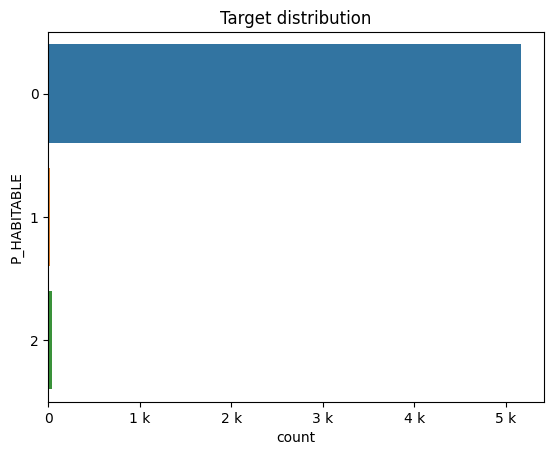

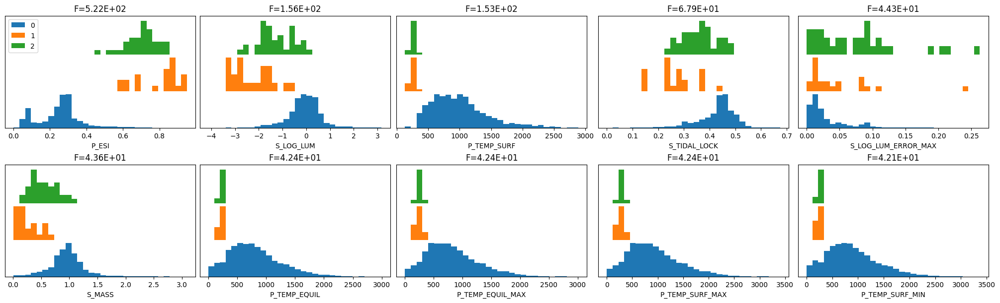

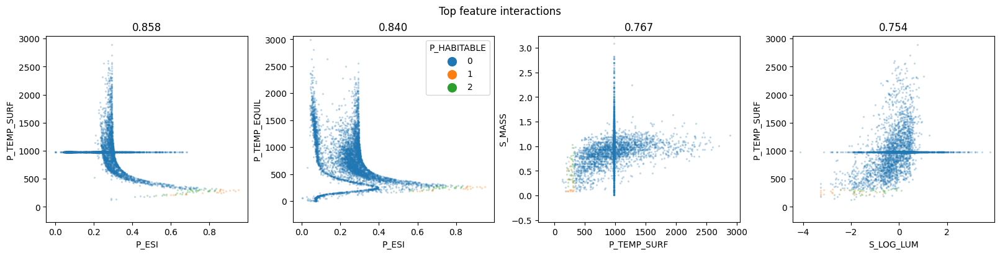

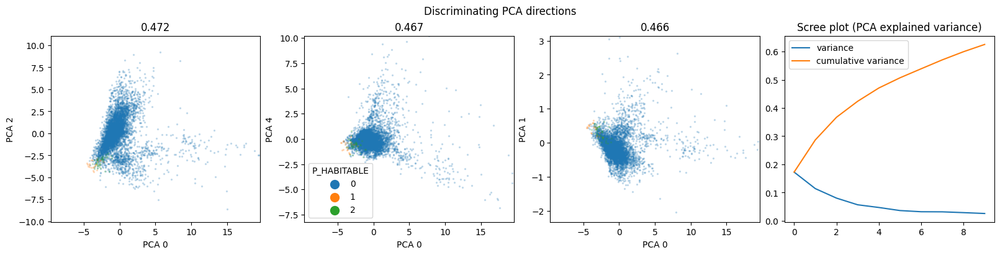

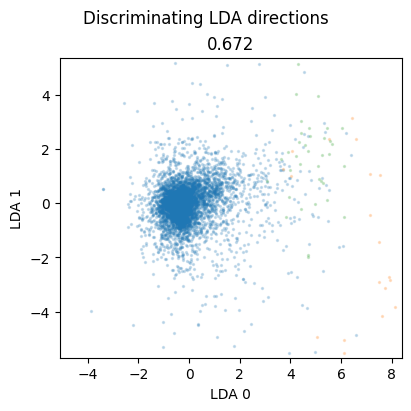

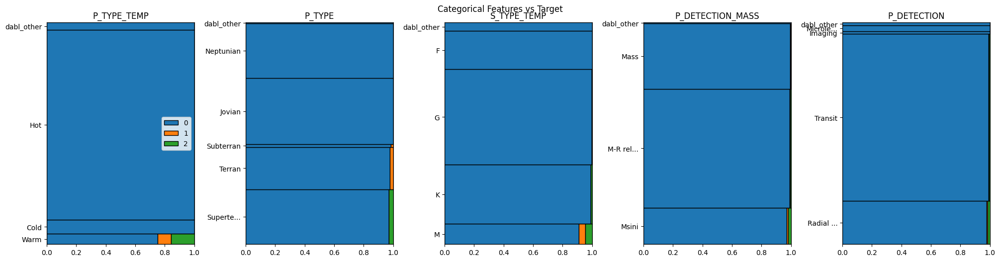

In [ ]:
import dabl
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')
dabl.plot(full_data, target_col = 'P_HABITABLE')

# Resolving Class Imbalance with Simple Oversampling Strategy

Clearly the data set is imbalanced having 98.64% inhabitable planets. Only 0.84% and 0.52% are conservatively habitable and optimistically habitable planets respectively. For getting proper performance of the ML models, we need to balance the data set first where each class will be having the same proportion of representation. We are using simple oversampling technique (resampling strategy) for that.

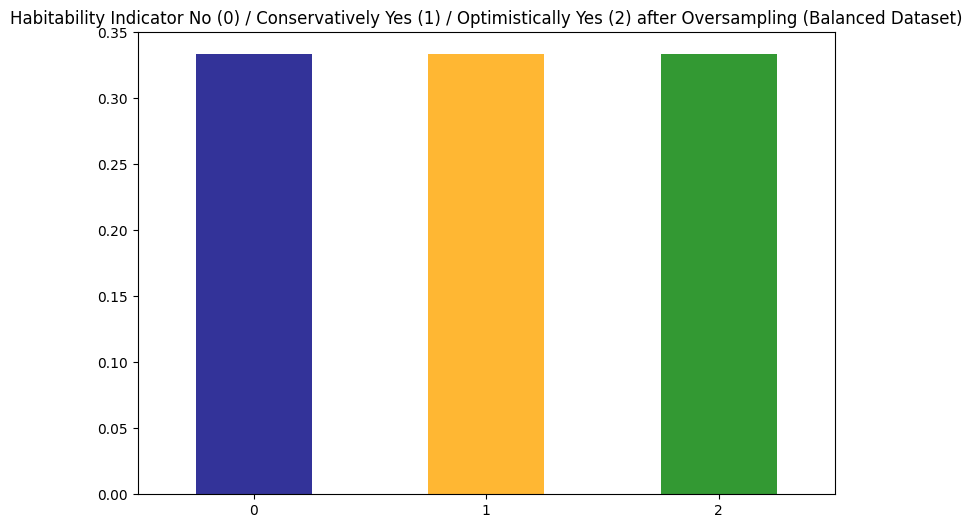

In [ ]:
from sklearn.utils import resample

no = full_data[full_data.P_HABITABLE == 0]
yes_cons = full_data[full_data.P_HABITABLE == 1]
yes_opti = full_data[full_data.P_HABITABLE == 2]
yes_cons_oversampled = resample(yes_cons, replace=True, n_samples=len(no), random_state=12345)
oversampled = pd.concat([no, yes_cons_oversampled])
yes_opti_oversampled = resample(yes_opti, replace=True, n_samples=len(no), random_state=12345)
oversampled = pd.concat([oversampled, yes_opti_oversampled])

fig = plt.figure(figsize = (9,6))
oversampled.P_HABITABLE.value_counts(normalize = True, ascending = False).plot(kind='bar', color= ['navy','orange','green'], alpha = 0.8, rot=0)
plt.title('Habitability Indicator No (0) / Conservatively Yes (1) / Optimistically Yes (2) after Oversampling (Balanced Dataset)')
plt.show()

In [ ]:
oversampled['P_HABITABLE'].value_counts(normalize=True)

0    0.333333
1    0.333333
2    0.333333
Name: P_HABITABLE, dtype: float64

Now we can observe that each class is having equal proportion of representation in the oversampled data set.

# Data Analysis through Visualization :

* **Planetary Detection Method:**

We will explore which planetary detection methods have been used extensively (by the word "extensive" we assume: more than 5 planets have been discovered using the method) over the years for discovering exoplanets.

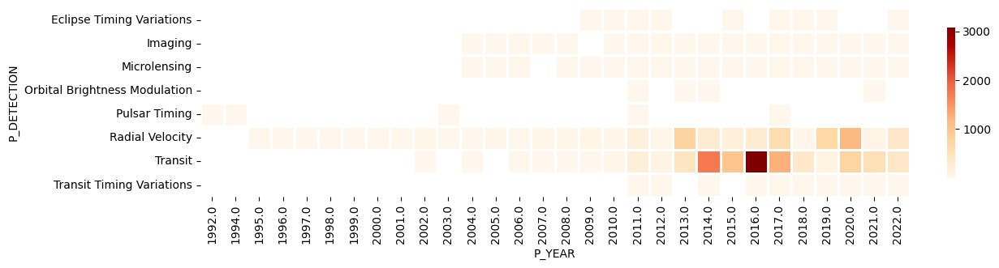

In [ ]:
by_p_detec = (oversampled
            .groupby('P_DETECTION')
            .filter(lambda x : len(x) > 5)
            .groupby(['P_DETECTION', 'P_YEAR'])
            .size()
            .unstack()
           )
import seaborn as sns
plt.figure(figsize=(12,12))
g = sns.heatmap(
    by_p_detec,
    square=True,
    cbar_kws={'fraction' : 0.01},
    cmap='OrRd',
    linewidth=1
)

We can observe *Transit* and *Radial Velocity* planetary detection techniques have been used most extensively for discovering exoplanets. Now, we will observe, how many planets detected by these two methods have posibility of habitability.

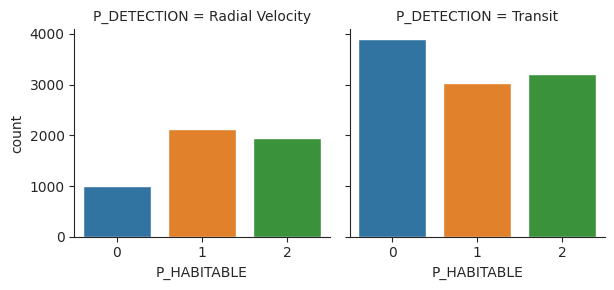

In [ ]:
import seaborn as sns
with sns.axes_style(style='ticks'):
    g = sns.catplot(x="P_HABITABLE", col="P_DETECTION", col_wrap=3, data=oversampled[oversampled['P_DETECTION'].isin(['Radial Velocity','Transit'])], kind="count", height=3.0, aspect=1.0)

We observe that *Radial Velocity* technique has been used more to detect conservatively habitable exoplanets. *Transit* technique has been used well to detect both optimistically habitable exoplanets and non-habitable exoplanets.

* **Stars and Planets Discovery over the Years:**

Next, we will explore which planets (under which star) were discovered in which year. This will clarify, how the discovery of exoplanets progressed over the years. All the stars (under whom the planets are listed) belong to different solar systems (not the solar system ruled by Sun). Here, we will plot only the stars which have more than 10 planets attached to them.

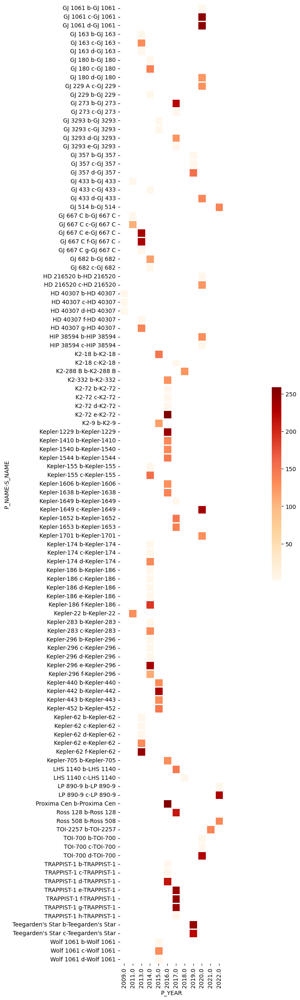

In [ ]:
by_p_s_name = (oversampled
            .groupby('S_NAME')
            .filter(lambda x : len(x) > 10)
            .groupby(['P_NAME', 'S_NAME','P_YEAR'])
            .size()
            .unstack()
           )

plt.figure(figsize=(30,30))
g = sns.heatmap(
    by_p_s_name,
    square=True,
    cbar_kws={'fraction' : 0.01},
    cmap='OrRd',
    linewidth=1
)

We see, for the star GJ667, planets were discovered in older years (2008-2009). For Kepler series stars, the planets were discovered in between years 2011 and 2014. For Trappist and Teegarden series stars, the planets have been discovered in very recent years (2017-2019).

For better exploration, we will consider P_UPDATED date to observe progress of star discovery and planet discovery over the years. We will see a steep increase in trend.

In [ ]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [ ]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [ ]:
configure_plotly_browser_state()
stars_by_date = oversampled.groupby('P_UPDATED')['S_NAME'].sum()
stars_by_date.iplot(kind='scatter', title='Discovery of Stars outside Solar System over the Years')

In [ ]:
configure_plotly_browser_state()
planets_by_date = oversampled.groupby('P_UPDATED')['P_NAME'].sum()
planets_by_date.iplot(kind='bar', title='Discovery of Exoplanets outside Solar System over the Years')

* **Influence of Planet Type / Star Spectral Type / Planet Thermal Type :**

Now, we will explore how some important features like planet type *(P_TYPE)*, star spectral type *(S_TEMP_TYPE)* and planet thermal type *(P_TYPE_TEMP)* influence the habitability of the exoplanets.

**Planet Type:** (Jovian, Superterran, Neptunian, Subterran, Terran, Miniterran). Their atmosphere can be potentially different. Terrans are able to hold a significant atmosphere with liquid water within the habitable zone (Eg: Earth). Superterrans are able to hold dense atmospheres with liquid water within the habitable zone. Subterrans are able to hold a significant atmospheres after the outer edges of the habitable zone (Eg: Mars). Jovians can have superdense atmospheres in the hot zone. Neptunians can have dense atmospheres in the hot zone. For details, check [Mass-Radius Classification of Exoplanets](http://phl.upr.edu/library/notes/amassclassificationforbothsolarandextrasolarplanets)

**Star Spectral Type (A,B,F,G,K,M,O):** This classification is based mostly on Hydrogen absorption lines. Class A: Stars with darkest H absorbtion lines; Class B: Stars with not as dark lines as Class A; Classes later in the alphabet correspond to weaker lines. Ref: [Classification by Williamina Fleming's group](https://sites.ualberta.ca/~pogosyan/teaching/ASTRO_122/lect12/lecture12.html)

**Planet Thermal Type :** Cold, Hot, Warm

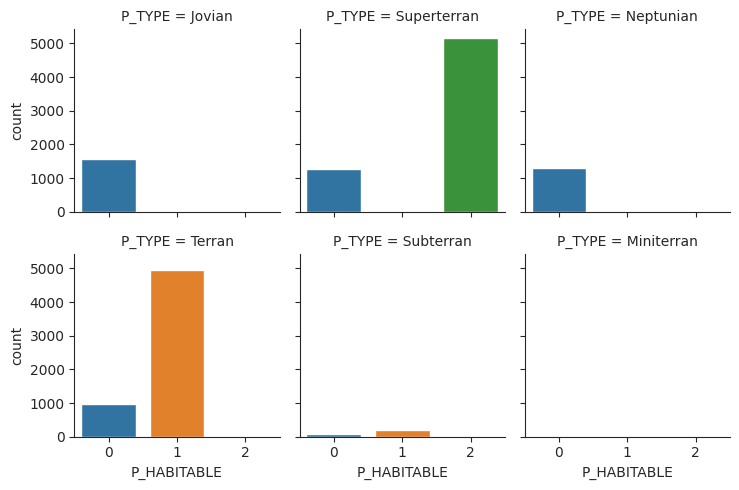

In [ ]:
import seaborn as sns
with sns.axes_style(style='ticks'):
    g = sns.catplot(x="P_HABITABLE", col="P_TYPE", col_wrap=3, data=oversampled, kind="count", height=2.5, aspect=1.0)

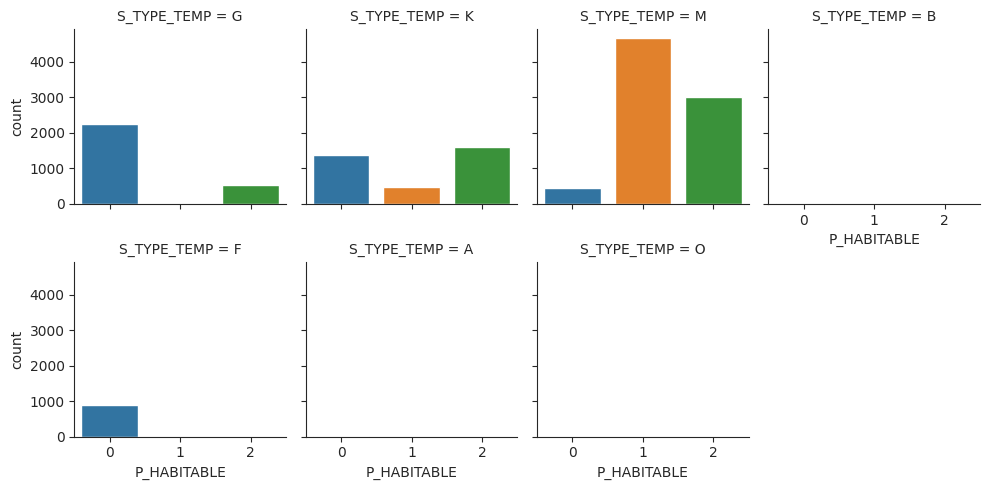

In [ ]:
with sns.axes_style(style='ticks'):
    g = sns.catplot(x="P_HABITABLE", col="S_TYPE_TEMP", col_wrap=4, data=oversampled, kind="count", height=2.5, aspect=1.0)

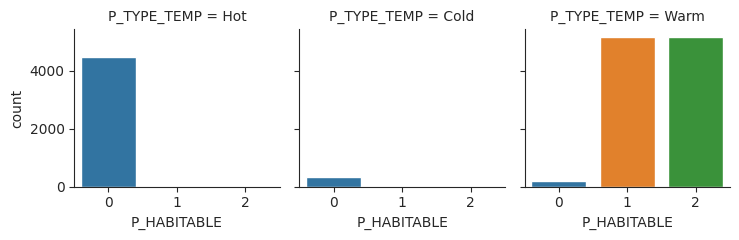

In [ ]:
with sns.axes_style(style='ticks'):
    g = sns.catplot(x="P_HABITABLE", col="P_TYPE_TEMP", col_wrap=3, data=oversampled, kind="count", height=2.5, aspect=1.0)

We can see, planet type *superterran* has high number of optimistically habitable planets and planet type *terran* has high number of conservatively habitable planets. Star spectral type *M* has high number of both conservatively habitable and optimistically habitable planets. Planet thermal type *warm* has very high number of both conservatively habitable and optimistically habitable planets.

* **Habitable Planets Discovery Years :**

Next, we will move to see over the years, how many number of habitable planets have been discovered.

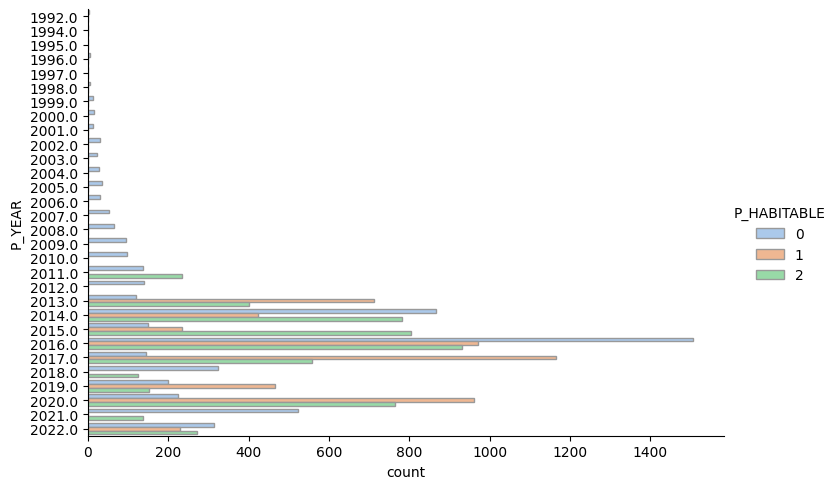

In [ ]:
sns.catplot(y="P_YEAR", hue="P_HABITABLE", kind="count",
            palette="pastel", edgecolor=".6",
            data=oversampled, aspect=1.5)

Notably, maximum number of conservatively habitable exoplanets have been discovered in 2013, 2017, 2019 respectively. And maximum number of optimistically habitable exoplanets have been discovered in 2014 and 2016 respectively.

* **Earth Similarity Index of a Planet and Influence on Habitability :**

Next, we will check for different planet type, how planet thermal type is influencing the earth similarity index, and whether a high earth similarity index (P_ESI) indicates a high possibility of habilitability or not. Interested folks can check the definition of earth similarity index below.

*P_ESI:* The Earth Similarity Index is an open multiparameter measure of Earth-likeness for solar or extrasolar planets as a number between zero (no similarity) and one (identical to Earth) **(*Schulze-Makuch et al., 2011*)**. For more details, please visit [this link](http://phl.upr.edu/projects/earth-similarity-index-esi#:~:text=The%20Earth%20Similarity%20Index%20(ESI,et%20al.%2C%202011).).

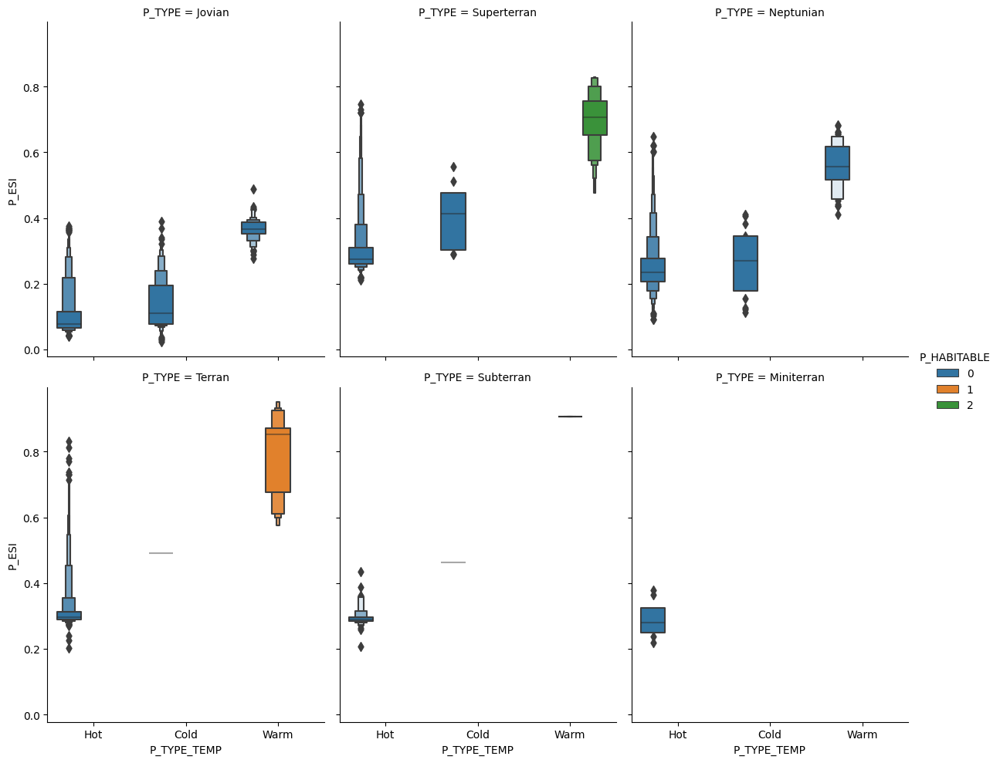

In [ ]:
sns.catplot(x="P_TYPE_TEMP", y="P_ESI", hue="P_HABITABLE",
            col="P_TYPE", col_wrap=3, aspect=0.8,
            kind="boxen", data=oversampled)

We infer that a high earth similarity index of an exoplanet actually corroborates with high possibility of habitability. For superterran planet type, when the planet thermal type is warm, it indicates a high number of optimistically habitable planets. For terran planet type, when planet thermal type is warm, it indicates a high number of conservatively habitable planets.

* **Stellar Constellations having Potentially Habitable Planets :**

Next, we will check the names of star constellations where most of the habitable exoplanets belong.

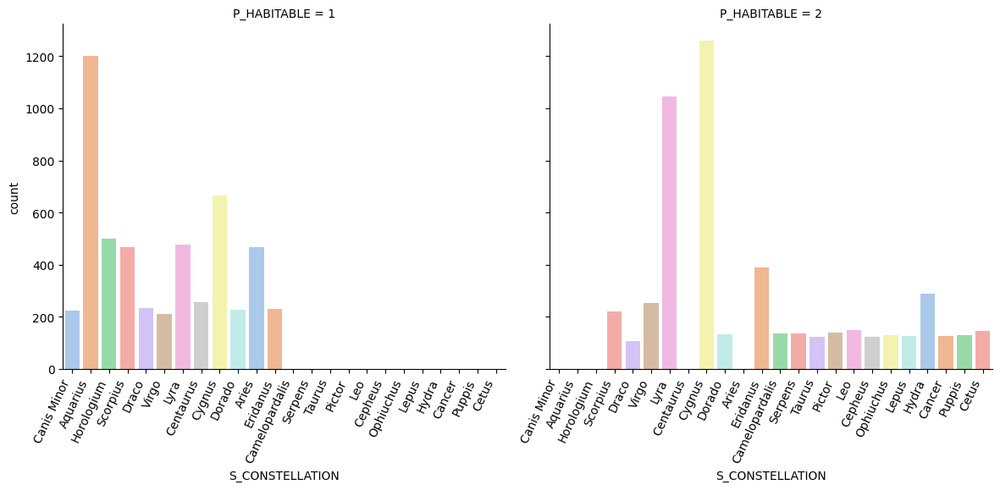

In [ ]:
label_size = 10
plt.rcParams['xtick.labelsize'] = label_size
chart = sns.catplot(
    data=oversampled[oversampled['P_HABITABLE'].isin([1,2])],
    x='S_CONSTELLATION',
    kind='count',
    palette='pastel',
    col='P_HABITABLE',
    aspect=1.2,
)
chart.set_xticklabels(rotation=65, horizontalalignment='right')

We observe that solar constellation *Aquarius* has the maximum number of conservatively habitable exoplanets. *Cygnus* and *Lyra* have the maximum number of optimistically habitable exoplanets respectively.

* **Time Frame when Planets with High ESI Discovered :**

Well, now we will scrutinize the exact time frame when planets with high Earth Similarity Index (ESI) have been discovered.

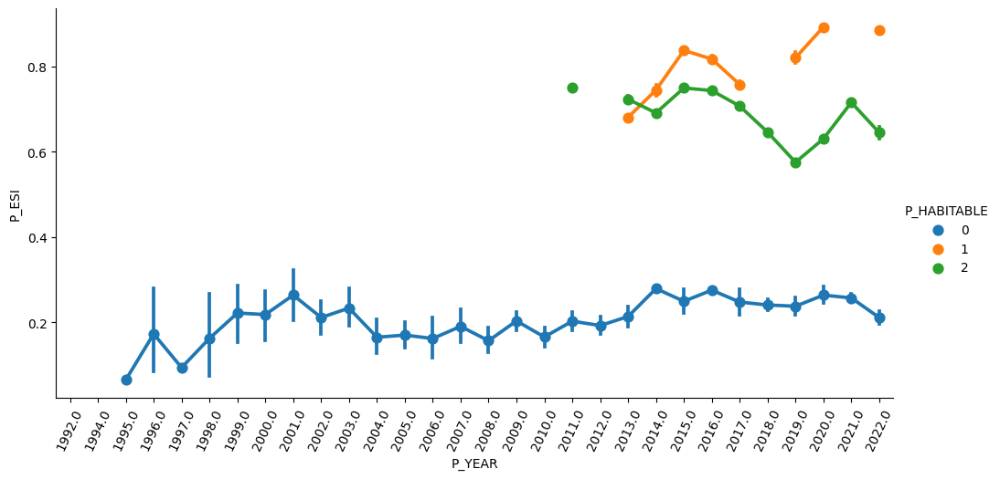

In [ ]:
p_plot = sns.catplot(x="P_YEAR", y="P_ESI", hue="P_HABITABLE", kind="point", data=oversampled, aspect=2.0)
p_plot.set_xticklabels(rotation=65)

Till 2011, only non-habitable planets having ESI less than or equal to 0.3 were discovered. From 2011 till 2019, habitable planets having high ESI (hovering in the range 0.6 - 0.9) have been discovered.

* **Influence of Planet Mass / Planet Radius / Planet Eccentricity on Habitability:**

Next, we will check how planet mass, planet radius and planet eccentricity influence habitability. While understanding mass and radius are pretty simple, understanding eccentricity can be difficult for some. Below is the definition of eccentricity for reference.

[Eccentricity](https://www.enchantedlearning.com/subjects/astronomy/glossary/Eccentricity.shtml) indicates how the planetary orbit deviates from a perfect circle. A perfectly circular orbit has an eccentricity = 0. A higher number indicates elliptical orbit.

In [ ]:
configure_plotly_browser_state()
import plotly.express as px
fig = px.scatter(oversampled, x=oversampled.P_MASS, y=oversampled.P_ESI, color=oversampled.P_HABITABLE,
                 hover_name=oversampled.P_NAME, log_x=True, size_max=30)
fig.show()

Planet mass in range 0.4 to 3.93 units correspond to conservatively habitable exoplanets. Planet mass in range 5.4 to 8.92 units correspond to optimistically habitable exoplanets. It is interesting to note that conservatively habitable exoplanets have a bit higher ESI compared to the ESI of optimistically habitable exoplanets.

In [ ]:
configure_plotly_browser_state()
import plotly.express as px
fig = px.scatter(oversampled, x=oversampled.P_RADIUS, y=oversampled.P_ESI, color=oversampled.P_HABITABLE,
                 hover_name=oversampled.P_NAME, log_x=True, size_max=30)
fig.show()

Planet radius in range 0.77 to 1.41 units correspond to conservatively habitable exoplanets. Planet radius in range 1.52 to 2.46 units correspond to optimistically habitable exoplanets. It is interesting to note that in most of the cases, conservatively habitable exoplanets have a bit higher ESI compared to the ESI of optimistically habitable exoplanets.

In [ ]:
configure_plotly_browser_state()
import plotly.express as px
fig = px.scatter(oversampled, x=oversampled.P_ECCENTRICITY, y=oversampled.P_ESI, color=oversampled.P_HABITABLE,
                 hover_name=oversampled.P_NAME, log_x=True, size_max=30)
fig.show()

Planet eccentricity in the range 0.02 to 0.35 units indicate a possibility of habitability.

* **Influence of Planetary Flux on Habitability :**

Next, we will check the influence of planet's stellar flux in habitability. For this purpose, we have filtered our data first to select only data pertaining to Earth Similarity Index > 0.65. To know how to calculate flux of a planet, check out [this link](http://www3.mpifr-bonn.mpg.de/div/hhertz/documents/smtoum/smtoum/node253.html).

In [ ]:
configure_plotly_browser_state()
df = oversampled.query("P_ESI > 0.65")
fig = px.bar(df, x="P_NAME", y="P_FLUX", color="P_HABITABLE")
fig.show()

We can see very high flux (150-300+ units on Y-axis) is associated with conservatively habitable planets, and moderately high flux (hovering around 150 units on Y-axis) is associated with optimistically habitable planets. Non-habitable planets have very low flux (less than 5 units).

* **Influence of Age of Planet on Habitability :**

Next, we will proceed to check if the age of planet (P_PERIOD) has any significant influence on deciding its habitability. Again we have filtered data to select only the planets with ESI > 0.65

In [ ]:
configure_plotly_browser_state()
df = oversampled.query("P_ESI > 0.65")
fig = px.line(df, x="P_NAME", y="P_PERIOD", color="P_HABITABLE", line_group="P_TYPE")
fig.show()

We can see that the conservatively habitable cluster has a period ranging between 9 days to 267 days. Planets under stars GJ 667, Kepler 62, Teegarden's Star, Trappist 1, Kepler 1229, GJ 1061 belong to this cluster.

Optimistically habitable cluster has a period ranging between 18 days to 448 days. Planets under starts Kepler 1606, Kepler 1638, Kepler 1540, Kepler 1410, Kepler 1653, Kepler 296, K2-296, GJ 832, Kepler 1632, Kepler 1544, LHS 1140, Kepler 26, Kepler 62, Kepler 298, HD 40307 belong to this cluster.   

# Preprocessing of Data :

* **Missing Data Pattern and Imputation :**

<Axes: >

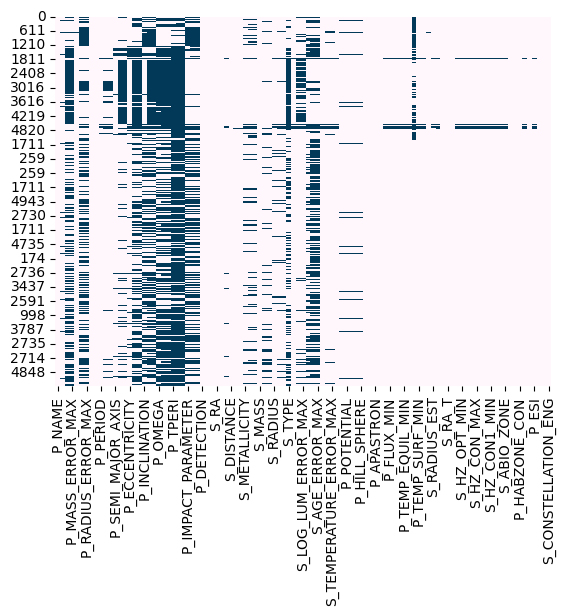

In [ ]:
# Missing Data Pattern in Training Data
import seaborn as sns
sns.heatmap(oversampled.isnull(), cbar=False, cmap='PuBu')

In [ ]:
total = oversampled.isnull().sum().sort_values(ascending=False)
percent = (oversampled.isnull().sum()/oversampled.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing.head(50)

,Total,Percent
P_TPERI_ERROR_MAX,12862,0.831040
P_TPERI_ERROR_MIN,12862,0.831040
P_TPERI,12832,0.829101
P_OMEGA_ERROR_MIN,9703,0.626930
P_OMEGA_ERROR_MAX,9703,0.626930
P_OMEGA,8934,0.577244
P_ECCENTRICITY_ERROR_MIN,8468,0.547134
P_ECCENTRICITY_ERROR_MAX,8468,0.547134
P_INCLINATION_ERROR_MAX,8430,0.544679
P_INCLINATION_ERROR_MIN,8428,0.544550


We notice, from 'P_GEO_ALBEDO' till 'P_MASS' all the features are having > 50% missing values. Hence, we will discard those features to avoid bias.

In [ ]:
compact_data = oversampled.drop(['P_TPERI_ERROR_MAX', 'P_TPERI_ERROR_MIN', 'P_TPERI',
                 'P_DENSITY', 'P_ESCAPE', 'P_GRAVITY', 'P_POTENTIAL', 'P_OMEGA_ERROR_MAX', 'P_OMEGA_ERROR_MIN', 'P_OMEGA', 'P_INCLINATION_ERROR_MAX',
                 'P_INCLINATION_ERROR_MIN', 'P_INCLINATION', 'P_ECCENTRICITY_ERROR_MAX', 'P_ECCENTRICITY_ERROR_MIN', 'S_AGE_ERROR_MIN', 'S_AGE_ERROR_MAX',
                 'P_IMPACT_PARAMETER_ERROR_MIN', 'P_IMPACT_PARAMETER_ERROR_MAX', 'P_IMPACT_PARAMETER', 'P_MASS_ERROR_MAX', 'P_MASS_ERROR_MIN', 'P_HILL_SPHERE',
                 'P_MASS'], axis = 1)

In [ ]:
compact_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15477 entries, 0 to 2735
Data columns (total 79 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   P_NAME                       15476 non-null  object 
 1   P_RADIUS                     15459 non-null  float64
 2   P_RADIUS_ERROR_MIN           9689 non-null   float64
 3   P_RADIUS_ERROR_MAX           9689 non-null   float64
 4   P_YEAR                       15477 non-null  float64
 5   P_UPDATED                    15476 non-null  object 
 6   P_PERIOD                     15293 non-null  float64
 7   P_PERIOD_ERROR_MIN           14672 non-null  float64
 8   P_PERIOD_ERROR_MAX           14672 non-null  float64
 9   P_SEMI_MAJOR_AXIS            15076 non-null  float64
 10  P_SEMI_MAJOR_AXIS_ERROR_MIN  11615 non-null  float64
 11  P_SEMI_MAJOR_AXIS_ERROR_MAX  11615 non-null  float64
 12  P_ECCENTRICITY               14058 non-null  float64
 13  P_DETECTION      

The compact data set is having 78 features. Now we will identify the categorical columns which have missing values, and we will impute them first with mode.

In [ ]:
compact_data.select_dtypes(include=['object']).columns

Index(['P_NAME', 'P_UPDATED', 'P_DETECTION', 'P_DETECTION_MASS', 'S_NAME',
       'S_TYPE', 'P_TYPE', 'S_TYPE_TEMP', 'S_RA_T', 'S_DEC_T', 'P_TYPE_TEMP',
       'S_CONSTELLATION', 'S_CONSTELLATION_ABR', 'S_CONSTELLATION_ENG'],
      dtype='object')

In [ ]:
compact_data_obj = compact_data.select_dtypes(include=['object'])

In [ ]:
total = compact_data_obj.isnull().sum().sort_values(ascending=False)
percent = (compact_data_obj.isnull().sum()/compact_data_obj.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing.head()

,Total,Percent
S_TYPE,7126,0.460425
P_TYPE_TEMP,168,0.010855
S_TYPE_TEMP,140,0.009046
P_TYPE,9,0.000582
P_NAME,1,0.000065


In [ ]:
compact_data['S_TYPE'] = compact_data['S_TYPE'].fillna(compact_data['S_TYPE'].mode()[0])
compact_data['P_TYPE_TEMP'] = compact_data['P_TYPE_TEMP'].fillna(compact_data['P_TYPE_TEMP'].mode()[0])
compact_data['S_TYPE_TEMP'] = compact_data['S_TYPE_TEMP'].fillna(compact_data['S_TYPE_TEMP'].mode()[0])
compact_data['P_TYPE'] = compact_data['P_TYPE'].fillna(compact_data['P_TYPE'].mode()[0])

* **Convert Categorical Features to Numerical :**

Now, we will convert the categorical columns to numeric ones using label encoding.

In [ ]:
# Convert categorical features to continuous features with Label Encoding
from sklearn.preprocessing import LabelEncoder
lencoders = {}
for col in compact_data.select_dtypes(include=['object']).columns:
    lencoders[col] = LabelEncoder()
    compact_data[col] = lencoders[col].fit_transform(compact_data[col])

Next, we will impute the missing values for entire data set (actually only the numeric ones, because we imputed the categorical ones using mode earlier) using MICE package.

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Multiple Imputation by Chained Equations
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
MiceImputed = compact_data.copy(deep=True)
mice_imputer = IterativeImputer()
MiceImputed.iloc[:, :] = mice_imputer.fit_transform(compact_data)

In [ ]:
MiceImputed.head()

,P_NAME,P_RADIUS,P_RADIUS_ERROR_MIN,P_RADIUS_ERROR_MAX,P_YEAR,P_UPDATED,P_PERIOD,P_PERIOD_ERROR_MIN,P_PERIOD_ERROR_MAX,P_SEMI_MAJOR_AXIS,...,S_ABIO_ZONE,S_TIDAL_LOCK,P_HABZONE_OPT,P_HABZONE_CON,P_TYPE_TEMP,P_HABITABLE,P_ESI,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG
0,0.0,12.1068,-0.250885,0.291658,2007.0,78.0,326.03000,-0.320000,0.320000,1.290000,...,0.476460,0.642400,0.0,0.0,1.0,0.0,0.083004,24.0,24.0,5.0
1,1.0,12.2189,-0.250885,0.291658,2009.0,98.0,516.21997,-3.200000,3.200000,1.530000,...,0.193891,0.541702,0.0,0.0,1.0,0.0,0.081792,83.0,83.0,42.0
2,2.0,12.8915,-0.250885,0.291658,2008.0,88.0,185.84000,-0.230000,0.230000,0.830000,...,0.502752,0.597816,0.0,0.0,1.0,0.0,0.081758,0.0,0.0,2.0
3,3.0,12.5552,-0.250885,0.291658,2002.0,28.0,1765.03890,-1.872561,1.677089,2.773069,...,0.923150,0.434927,0.0,0.0,0.0,0.0,0.163310,39.0,39.0,34.0
4,4.0,13.4520,-0.250885,0.291658,1996.0,5.0,798.50000,-1.000000,1.000000,1.660000,...,1.983658,0.512355,1.0,1.0,2.0,0.0,0.368405,30.0,30.0,75.0


In [ ]:
MiceImputed.isna().sum(axis = 0)

P_NAME                 0
P_RADIUS               0
P_RADIUS_ERROR_MIN     0
P_RADIUS_ERROR_MAX     0
P_YEAR                 0
                      ..
P_HABITABLE            0
P_ESI                  0
S_CONSTELLATION        0
S_CONSTELLATION_ABR    0
S_CONSTELLATION_ENG    0
Length: 79, dtype: int64

* **Removing Multicollinearity :**

Next, we will check whether perfect correlation exists among any feature pair. To avoid multicollinearity, we will exclude one and keep one from those pairs.

<Axes: >

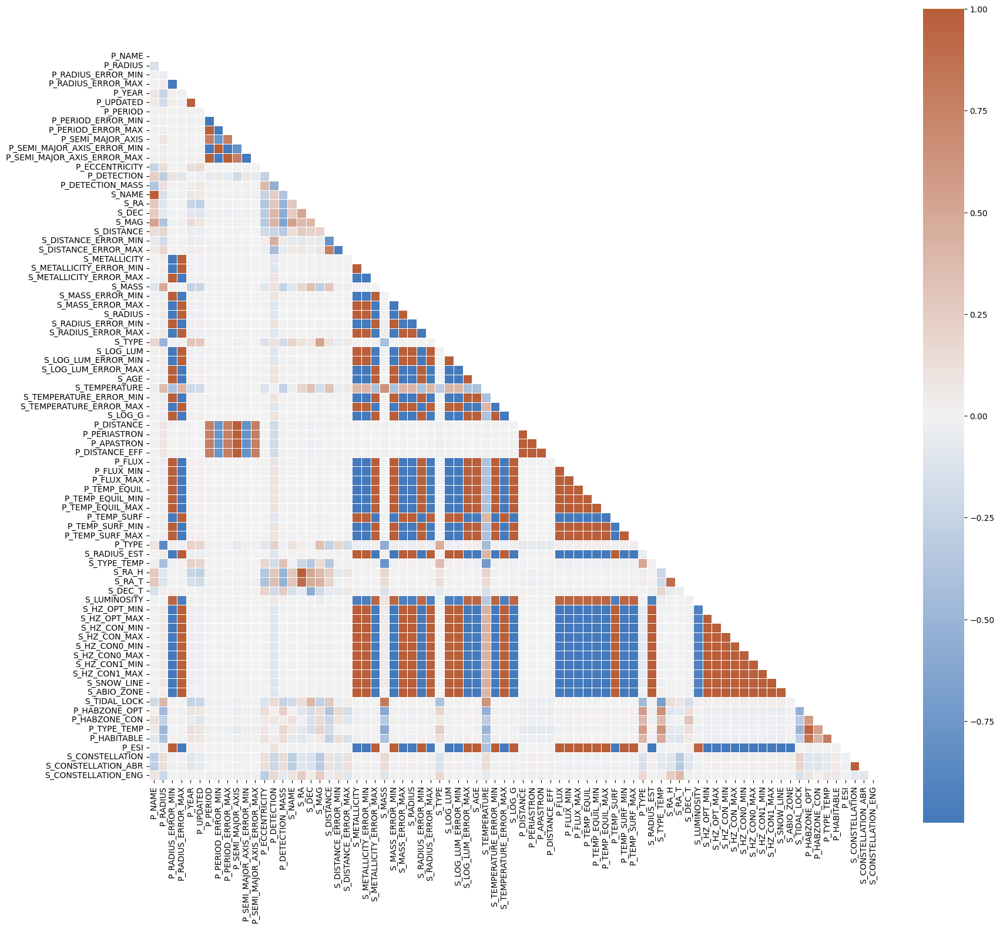

In [ ]:
# Correlation Heatmap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
corr = MiceImputed.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20, 20))
cmap = sns.diverging_palette(250, 25, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=False, linewidths=.5, cbar_kws={"shrink": 0.9})

We avoided annotation above to maintain clarity of the image, but the dark red squares are evidence of perfect correlation among the pairs of intersecting features. We will discard them.

In [ ]:
#Drop perfectly correlated features
working_data = MiceImputed.drop(['S_NAME', 'P_RADIUS', 'P_RADIUS_ERROR_MIN', 'P_RADIUS_ERROR_MAX', 'P_DISTANCE', 'P_PERIASTRON', 'P_APASTRON',
                                 'P_DISTANCE_EFF', 'P_FLUX_MIN', 'P_FLUX_MAX', 'P_TEMP_EQUIL', 'P_TEMP_EQUIL_MIN', 'P_TEMP_EQUIL_MAX',
                                 'S_RADIUS_EST', 'S_RA_H', 'S_RA_T', 'S_LUMINOSITY', 'S_HZ_OPT_MIN', 'S_HZ_OPT_MAX', 'S_HZ_CON_MIN',
                                 'S_HZ_CON_MAX', 'S_HZ_CON0_MIN', 'S_HZ_CON0_MAX', 'S_HZ_CON1_MIN', 'S_HZ_CON1_MAX', 'S_SNOW_LINE',
                                'P_PERIOD_ERROR_MIN', 'P_PERIOD_ERROR_MAX', 'S_MAG', 'S_DISTANCE_ERROR_MIN', 'S_DISTANCE_ERROR_MAX',
                                 'S_METALLICITY', 'S_METALLICITY_ERROR_MIN', 'S_METALLICITY_ERROR_MAX', 'S_AGE', 'S_TEMPERATURE_ERROR_MIN',
                                 'S_TEMPERATURE_ERROR_MAX', 'S_ABIO_ZONE', 'P_ESI', 'S_CONSTELLATION_ABR'], axis=1)

In [ ]:
working_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15477 entries, 0 to 2735
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   P_NAME                       15477 non-null  float64
 1   P_YEAR                       15477 non-null  float64
 2   P_UPDATED                    15477 non-null  float64
 3   P_PERIOD                     15477 non-null  float64
 4   P_SEMI_MAJOR_AXIS            15477 non-null  float64
 5   P_SEMI_MAJOR_AXIS_ERROR_MIN  15477 non-null  float64
 6   P_SEMI_MAJOR_AXIS_ERROR_MAX  15477 non-null  float64
 7   P_ECCENTRICITY               15477 non-null  float64
 8   P_DETECTION                  15477 non-null  float64
 9   P_DETECTION_MASS             15477 non-null  float64
 10  S_RA                         15477 non-null  float64
 11  S_DEC                        15477 non-null  float64
 12  S_DISTANCE                   15477 non-null  float64
 13  S_MASS           

The working data set is having only 38 features at this stage. Now we will cross-check their correlation once again with annotation whether any square comes up with an annotation "1".

<Axes: >

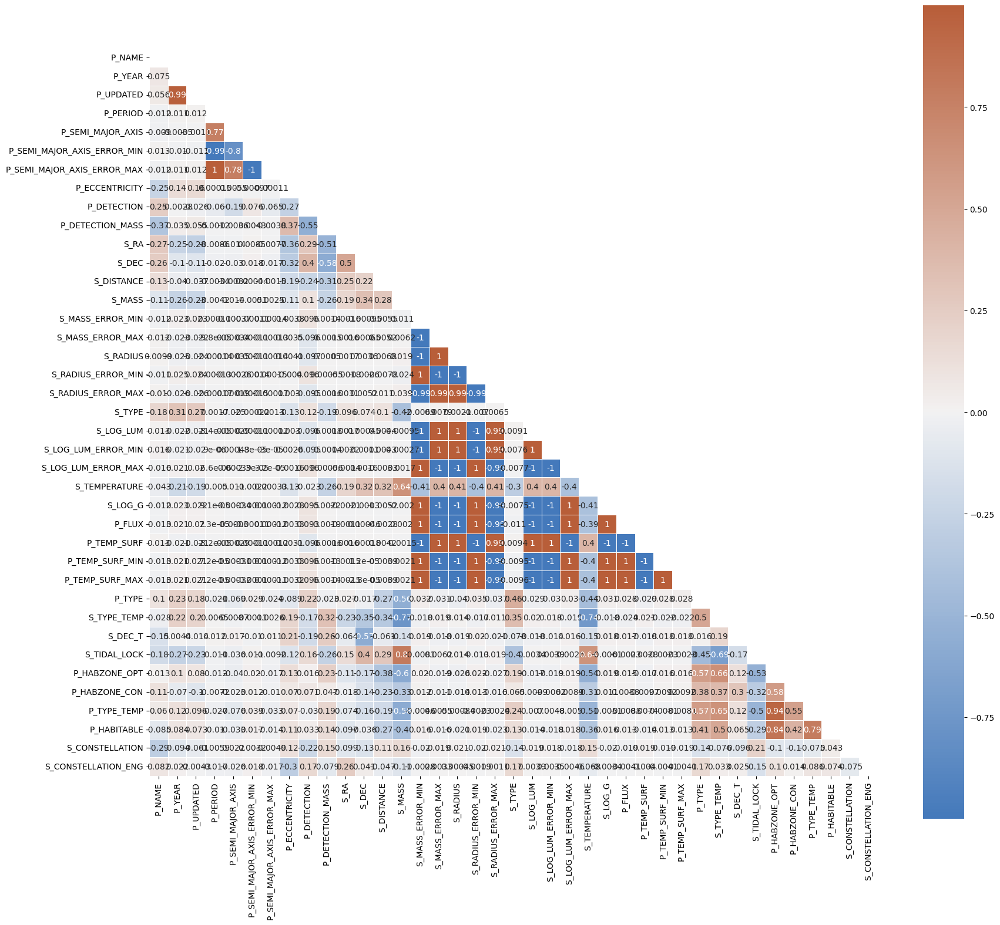

In [ ]:
# Correlation Heatmap for reduced working data set
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
corr = working_data.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20, 20))
cmap = sns.diverging_palette(250, 25, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": 0.9})

Some high correlations are spotted but there is no perfect correlation i.e. "1".

* **Removal of Outliers :**

Next, we will proceed to identify the outliers using IQR (Inter Quartile Range) and will remove those.

In [ ]:
# Detecting outliers with IQR
Q1 = working_data.quantile(0.25)
Q3 = working_data.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

P_NAME                         3073.000000
P_YEAR                            5.000000
P_UPDATED                        65.000000
P_PERIOD                         91.245610
P_SEMI_MAJOR_AXIS                 0.355000
P_SEMI_MAJOR_AXIS_ERROR_MIN       0.266634
P_SEMI_MAJOR_AXIS_ERROR_MAX       0.556007
P_ECCENTRICITY                    0.111000
P_DETECTION                       1.000000
P_DETECTION_MASS                  3.000000
S_RA                            157.730470
S_DEC                            62.053780
S_DISTANCE                      357.882111
S_MASS                            0.580000
S_MASS_ERROR_MIN                  0.030000
S_MASS_ERROR_MAX                  0.030000
S_RADIUS                          0.550000
S_RADIUS_ERROR_MIN                0.060000
S_RADIUS_ERROR_MAX                0.060000
S_TYPE                           31.000000
S_LOG_LUM                         1.686000
S_LOG_LUM_ERROR_MIN               0.055769
S_LOG_LUM_ERROR_MAX               0.055000
S_TEMPERATU

In [ ]:
# Removing outliers from dataset
working_data = working_data[~((working_data < (Q1 - 1.5 * IQR)) |(working_data > (Q3 + 1.5 * IQR))).any(axis=1)]

# Feature Selection :

After completion of data preprocessing, we will select the really important features which are contributing towards habitability of the exoplanets. We will use permutation importance using Random Forest and wrapper method using Random Forest as well as Extra Trees classifier.

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107717 sha256=c64173ad3b6cd7fb9ae95e475d6a684103cb915a9cee4032717591980c5262f7
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.ensemble import RandomForestClassifier as rf

X = working_data.drop('P_HABITABLE', axis=1)
y = working_data['P_HABITABLE']
perm = PermutationImportance(rf(n_estimators=10, random_state=0).fit(X,y),random_state=1).fit(X,y)
eli5.show_weights(perm, feature_names = X.columns.tolist())

Weight,Feature
0.0041 ± 0.0008,P_TYPE_TEMP
0.0003 ± 0.0000,P_HABZONE_OPT
0 ± 0.0000,P_YEAR
0 ± 0.0000,S_MASS_ERROR_MIN
0 ± 0.0000,S_MASS
0 ± 0.0000,S_DISTANCE
0 ± 0.0000,S_DEC
0 ± 0.0000,S_RA
0 ± 0.0000,P_DETECTION_MASS
0 ± 0.0000,S_RADIUS_ERROR_MIN


In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier as rf

#X = working_data.drop('P_HABITABLE', axis=1)
#y = MiceImputed['P_HABITABLE']
selector = SelectFromModel(rf(n_estimators=1000, random_state=0))
selector.fit(X, y)
support = selector.get_support()
features = X.loc[:,support].columns.tolist()
print(features)
print(rf(n_estimators=1000, random_state=0).fit(X,y).feature_importances_)

['P_NAME', 'P_PERIOD', 'P_SEMI_MAJOR_AXIS', 'S_RA', 'S_MASS', 'S_TEMPERATURE', 'S_LOG_G', 'P_FLUX', 'P_TEMP_SURF', 'P_TEMP_SURF_MIN', 'P_TEMP_SURF_MAX', 'P_TYPE', 'S_TIDAL_LOCK', 'P_TYPE_TEMP']
[4.38382882e-02 7.37912248e-03 8.13527102e-03 3.31740795e-02
 3.19028303e-02 1.40330113e-02 6.53459830e-03 6.77499648e-03
 2.22407523e-03 2.39977772e-03 4.01799391e-02 1.21812876e-02
 5.85258557e-03 3.90237793e-02 7.99416862e-03 1.31440804e-02
 1.87988059e-02 3.77646729e-03 4.99332853e-03 8.23584973e-03
 1.84937365e-02 4.84220491e-03 6.51747469e-03 4.83071440e-02
 3.42948491e-02 3.52631251e-02 3.69012760e-02 4.48175602e-02
 4.16382544e-02 2.46126240e-01 7.54160447e-05 1.30280321e-02
 8.17154861e-02 2.58029309e-02 3.48541760e-03 2.71919929e-02
 1.30129588e-02 7.90955859e-03]


In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier as et
selector = SelectFromModel(et(n_estimators=1000, random_state=123))
selector.fit(X, y)
support = selector.get_support()
features = X.loc[:,support].columns.tolist()
print(features)
print(et(n_estimators=100, random_state=123).fit(X,y).feature_importances_)

['P_NAME', 'S_MASS', 'S_LOG_LUM', 'S_LOG_G', 'P_TEMP_SURF_MIN', 'P_TYPE', 'S_TIDAL_LOCK', 'P_HABZONE_OPT', 'P_TYPE_TEMP', 'S_CONSTELLATION']
[0.02828686 0.01084736 0.0127408  0.02093876 0.0225232  0.00905293
 0.0067079  0.01740994 0.00512954 0.01339013 0.01583    0.00983441
 0.0188726  0.02495019 0.03500211 0.01888874 0.01871076 0.00629029
 0.01041137 0.01013455 0.03438207 0.01313854 0.01066494 0.02183072
 0.02492435 0.01249131 0.01848615 0.02255237 0.01540095 0.32149865
 0.00959439 0.01290656 0.04458515 0.04185717 0.0134703  0.03300146
 0.02642236 0.00684011]


From the three sets of important features, we will choose the ones which appear repeatedly in more than one method. The chosen ones are really important features.

# Train-Test Split :

In [ ]:
features = working_data[['P_TYPE_TEMP','P_PERIOD','S_DEC','S_DISTANCE','S_MASS','S_TEMPERATURE','P_TYPE','S_TIDAL_LOCK','P_HABZONE_OPT']]
target = working_data['P_HABITABLE']

# Split into test and train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.20, random_state=12345)

# Normalize Features
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

# Modelling with Supervised Learning:

We are using ***one-vs-rest strategy*** for all classifiers for ***multi-class classification*** problem. This strategy breaks down a multi-class classification problem to multiple binary classification problems and then compares/ combines the results. The following models are used for classification purpose.
* Logistic Regression with Ridge Penalty
* Stochastic Gradient Descent with Lasso Penalty
* Multinomial Naive Bayes
* Passive Aggressive Classifier with Hinge Loss
* Perceptron
* Gradient Boosting Classifier

In [ ]:
# Common function
import time
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import accuracy_score, hamming_loss, cohen_kappa_score, confusion_matrix, classification_report
def run_model(model, X_train, y_train, X_test, y_test, verbose=True):
    t0=time.time()
    if verbose == False:
        model_ovr = OneVsRestClassifier(model)
        model_ovr.fit(X_train,y_train, verbose=0)
    else:
        model_ovr = OneVsRestClassifier(model)
        model_ovr.fit(X_train,y_train)
    y_pred = model_ovr.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    h_loss = hamming_loss(y_test, y_pred)
    coh_kap = cohen_kappa_score(y_test, y_pred)
    time_taken = time.time()-t0
    print("Accuracy = {}".format(accuracy))
    print("Hamming Loss = {}".format(h_loss))
    print("Cohen's Kappa = {}".format(coh_kap))
    print("Time taken = {}".format(time_taken))
    print(classification_report(y_test,y_pred,digits=5))
    sns.heatmap(confusion_matrix(model_ovr.predict(X_test), y_test),annot=True)

    return accuracy, h_loss, coh_kap, time_taken

**[1] Logistic Regression with Ridge Penalty :**

Accuracy = 0.9984790874524715
Hamming Loss = 0.001520912547528517
Cohen's Kappa = 0.9971699189284
Time taken = 1.274092435836792
              precision    recall  f1-score   support

         0.0    1.00000   0.96970   0.98462        66
         1.0    0.99719   1.00000   0.99859       709
         2.0    1.00000   1.00000   1.00000       540

    accuracy                        0.99848      1315
   macro avg    0.99906   0.98990   0.99440      1315
weighted avg    0.99848   0.99848   0.99847      1315



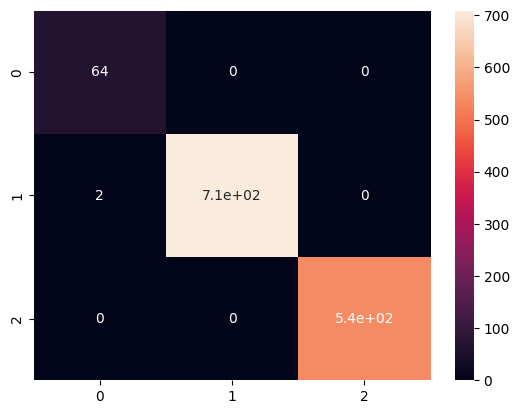

In [ ]:
from sklearn.linear_model import LogisticRegression

params_lr = {'penalty': 'l1', 'solver':'saga', 'multi_class':'multinomial'} #Ridge regularization
model_lr = LogisticRegression(**params_lr)
accuracy_lr, h_loss_lr, coh_kap_lr, tt_lr = run_model(model_lr, X_train, y_train, X_test, y_test)

**[2] Stochastic Gradient Descent with Hinge Loss and Lasso Penalty :**

Accuracy = 0.9984790874524715
Hamming Loss = 0.001520912547528517
Cohen's Kappa = 0.9971699189284
Time taken = 0.0754692554473877
              precision    recall  f1-score   support

         0.0    1.00000   0.96970   0.98462        66
         1.0    0.99719   1.00000   0.99859       709
         2.0    1.00000   1.00000   1.00000       540

    accuracy                        0.99848      1315
   macro avg    0.99906   0.98990   0.99440      1315
weighted avg    0.99848   0.99848   0.99847      1315



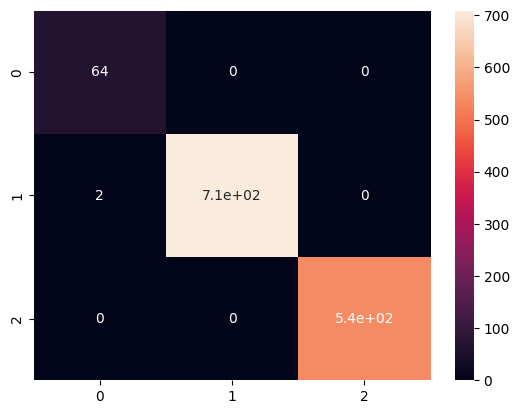

In [ ]:
from sklearn.linear_model import SGDClassifier
# Lasso regularization
params_sgd = {'loss':'hinge', 'penalty':'l2', 'alpha': 1e-3, 'random_state': 12345, 'max_iter': 6, 'tol': None}
model_sgd = SGDClassifier(**params_sgd)
accuracy_sgd, h_loss_sgd, coh_kap_sgd, tt_sgd = run_model(model_sgd, X_train, y_train, X_test, y_test)

**[3] Multinomial Naive Bayes :**

Accuracy = 0.6745247148288973
Hamming Loss = 0.32547528517110264
Cohen's Kappa = 0.36107292341888775
Time taken = 0.03268861770629883
              precision    recall  f1-score   support

         0.0    0.00000   0.00000   0.00000        66
         1.0    0.70416   0.81241   0.75442       709
         2.0    0.62575   0.57593   0.59981       540

    accuracy                        0.67452      1315
   macro avg    0.44330   0.46278   0.45141      1315
weighted avg    0.63662   0.67452   0.65306      1315



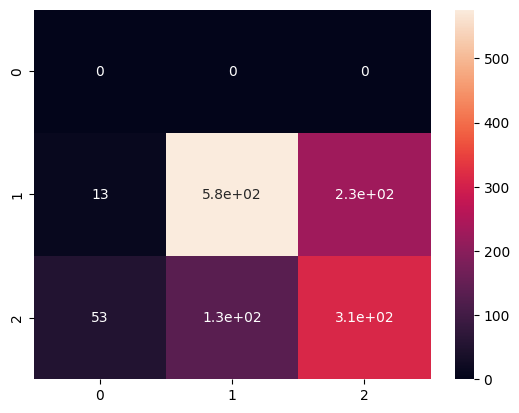

In [ ]:
from sklearn.naive_bayes import MultinomialNB
model_mnb = MultinomialNB()
accuracy_mnb, h_loss_mnb, coh_kap_mnb, tt_mnb = run_model(model_mnb, X_train, y_train, X_test, y_test)

**[4] Passive Aggressive Classifier with Hinge Loss :**

Accuracy = 1.0
Hamming Loss = 0.0
Cohen's Kappa = 1.0
Time taken = 0.055994272232055664
              precision    recall  f1-score   support

         0.0    1.00000   1.00000   1.00000        66
         1.0    1.00000   1.00000   1.00000       709
         2.0    1.00000   1.00000   1.00000       540

    accuracy                        1.00000      1315
   macro avg    1.00000   1.00000   1.00000      1315
weighted avg    1.00000   1.00000   1.00000      1315



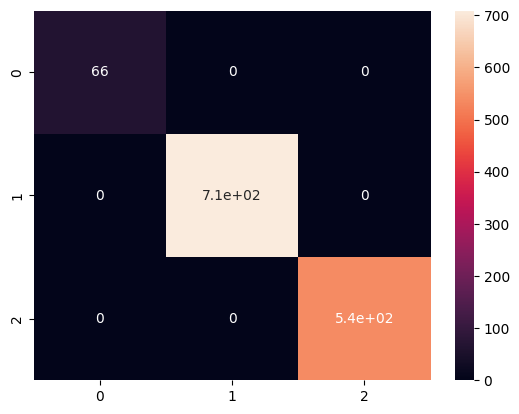

In [ ]:
from sklearn.linear_model import PassiveAggressiveClassifier
params_pac = {'fit_intercept':True, 'random_state': 12345, 'loss':'hinge'}
model_pac = PassiveAggressiveClassifier(**params_pac)
accuracy_pac, h_loss_pac, coh_kap_pac, tt_pac = run_model(model_pac, X_train, y_train, X_test, y_test)

**[5] Simple Perceptron without any Penalty :**

Accuracy = 0.9984790874524715
Hamming Loss = 0.001520912547528517
Cohen's Kappa = 0.9971699189284
Time taken = 0.05003094673156738
              precision    recall  f1-score   support

         0.0    1.00000   0.96970   0.98462        66
         1.0    0.99719   1.00000   0.99859       709
         2.0    1.00000   1.00000   1.00000       540

    accuracy                        0.99848      1315
   macro avg    0.99906   0.98990   0.99440      1315
weighted avg    0.99848   0.99848   0.99847      1315



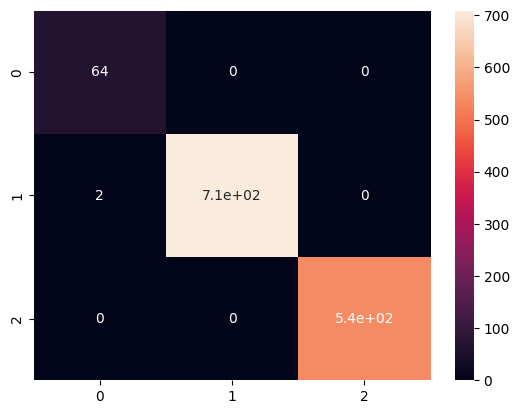

In [ ]:
from sklearn.linear_model import Perceptron
params_p = {'penalty':None, 'alpha': 1e-5, 'fit_intercept': True, 'random_state': 12345}
model_p = Perceptron(**params_p)
accuracy_p, h_loss_p, coh_kap_p, tt_p = run_model(model_p, X_train, y_train, X_test, y_test)

**[6] Gradient Boosting Classifier :**

Accuracy = 0.9809885931558935
Hamming Loss = 0.019011406844106463
Cohen's Kappa = 0.964511751872646
Time taken = 5.106311321258545
              precision    recall  f1-score   support

         0.0    1.00000   1.00000   1.00000        66
         1.0    0.96594   1.00000   0.98267       709
         2.0    1.00000   0.95370   0.97630       540

    accuracy                        0.98099      1315
   macro avg    0.98865   0.98457   0.98633      1315
weighted avg    0.98164   0.98099   0.98093      1315



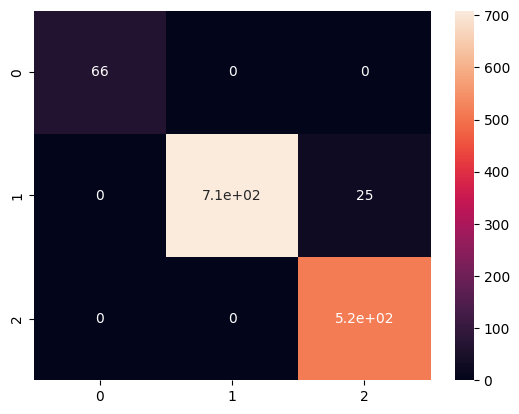

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
params_gb = {'loss':'deviance', 'criterion': 'friedman_mse', 'n_estimators': 100, 'max_depth': 4, 'random_state': 12345, 'max_features': 'auto'}
model_gb = GradientBoostingClassifier(**params_gb)
accuracy_gb, h_loss_gb, coh_kap_gb, tt_gb = run_model(model_gb, X_train, y_train, X_test, y_test)

* **Decision Boundary Plotting for the Models :**

We will also perform decision region plotting in order to determine model performance properly.

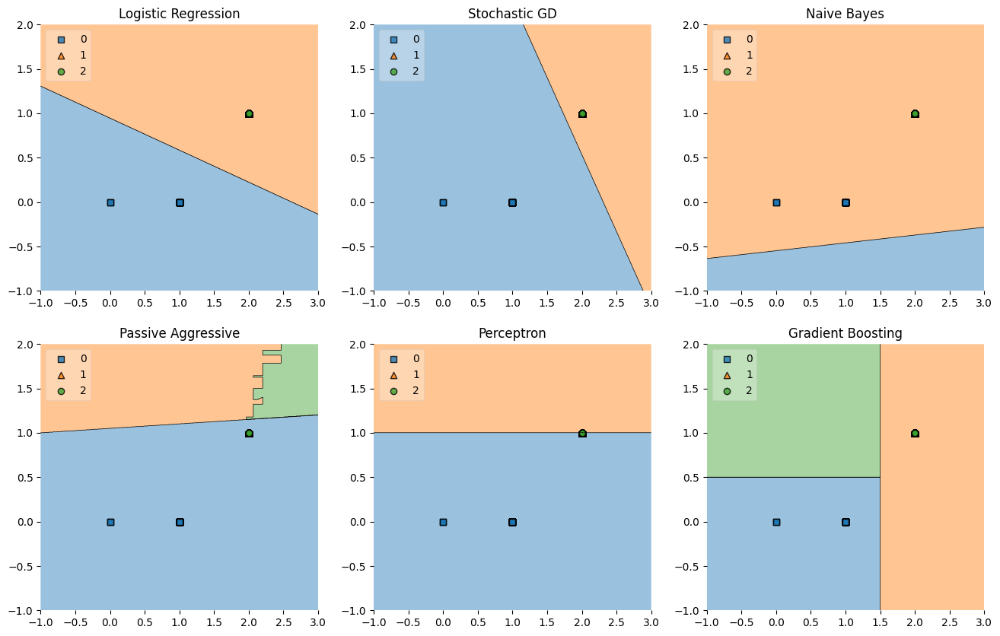

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import itertools
from mlxtend.plotting import plot_decision_regions

value = 1.50
width = 0.75

clf1 = LogisticRegression(solver='saga', penalty='l1', random_state=12345)
clf2 = SGDClassifier(random_state=12345)
clf3 = MultinomialNB()
clf4 = PassiveAggressiveClassifier(random_state=12345)
clf5 = Perceptron(random_state=12345, verbose = 0)
clf6 = GradientBoostingClassifier(n_estimators=1000, random_state=12345, verbose=0)

#Only taking the important planetarial features
X_list = working_data[["P_TYPE_TEMP", "P_HABZONE_OPT"]]
X = np.asarray(X_list, dtype=np.float32)
y_list = working_data["P_HABITABLE"]
y = np.asarray(y_list, dtype=np.int32)

# Plotting Decision Regions
gs = gridspec.GridSpec(2,3)
fig = plt.figure(figsize=(16,10))

labels = ['Logistic Regression',
          'Stochastic GD',
          'Naive Bayes',
          'Passive Aggressive',
          'Perceptron',
          'Gradient Boosting']

for clf, lab, grd in zip([clf1, clf2, clf3, clf4, clf5, clf6],
                         labels,
                         itertools.product([0, 1, 2],
                         repeat=2)):
    clf.fit(X, y)
    ax = plt.subplot(gs[grd[0], grd[1]])
    fig = plot_decision_regions(X=X, y=y, clf=clf,
                                filler_feature_values={2: value},
                                filler_feature_ranges={2: width},
                                legend=2)
    plt.title(lab)

plt.show()

We can observe a striking similarity in decision boundaries plotted by Passive Aggressive classifier and Peceptron model. Both of them have demarcated three class regions aptly and have very low misclassification. Apart from these two models, linear models like Logistic Regression and Stochastic Gradient Descent have also lower misclassifiction.

# Supervised Models Comparison :

We will take accuracy score, hinge loss, cohen kappa and time taken for execution into account for judging model performance. This apart we have already explored our observation from decision boundary plotting in previous step above.

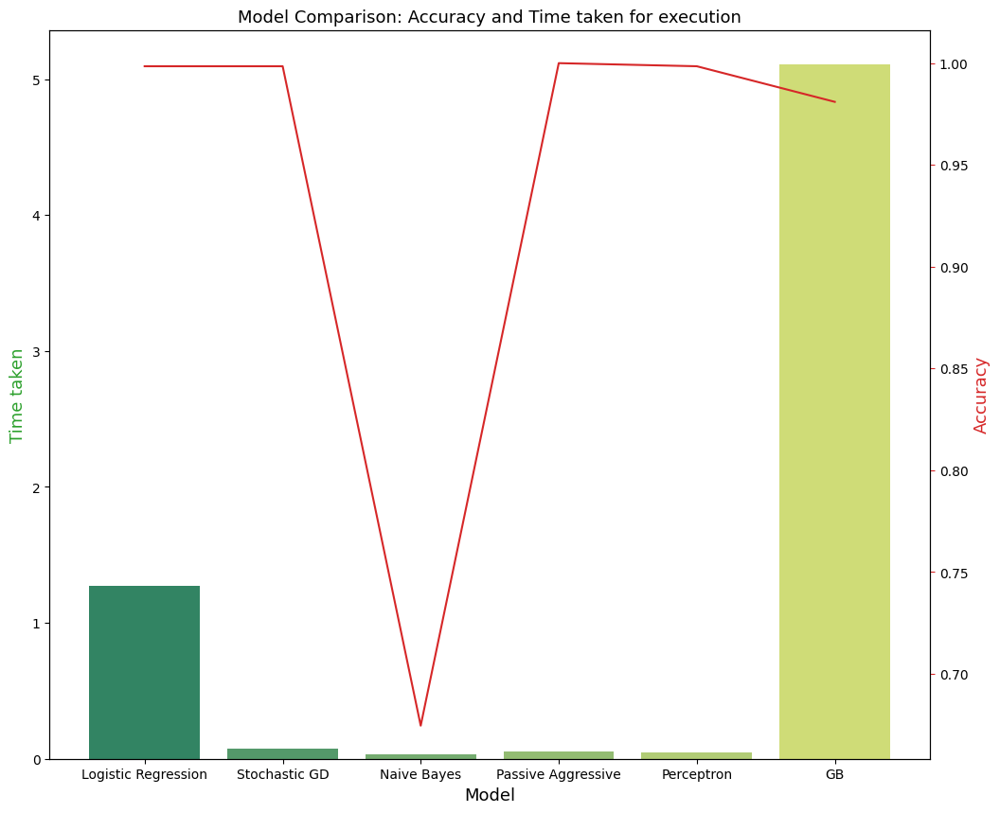

In [ ]:
accuracy_scores = [accuracy_lr, accuracy_sgd, accuracy_mnb, accuracy_pac, accuracy_p, accuracy_gb]
h_loss_scores = [h_loss_lr, h_loss_sgd, h_loss_mnb, h_loss_pac, h_loss_p, h_loss_gb]
coh_kap_scores = [coh_kap_lr, coh_kap_sgd, coh_kap_mnb, coh_kap_pac, coh_kap_p, coh_kap_gb]
tt = [tt_lr, tt_sgd, tt_mnb, tt_pac, tt_p, tt_gb]

model_data = {'Model': ['Logistic Regression','Stochastic GD','Naive Bayes','Passive Aggressive','Perceptron','GB'],
              'Accuracy': accuracy_scores,
              'Hamming_Loss': h_loss_scores,
              'Cohen_Kappa': coh_kap_scores,
              'Time taken': tt}
data = pd.DataFrame(model_data)

fig, ax1 = plt.subplots(figsize=(12,10))
ax1.set_title('Model Comparison: Accuracy and Time taken for execution', fontsize=13)
color = 'tab:green'
ax1.set_xlabel('Model', fontsize=13)
ax1.set_ylabel('Time taken', fontsize=13, color=color)
ax2 = sns.barplot(x='Model', y='Time taken', data = data, palette='summer')
ax1.tick_params(axis='y')
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Accuracy', fontsize=13, color=color)
ax2 = sns.lineplot(x='Model', y='Accuracy', data = data, sort=False, color=color)
ax2.tick_params(axis='y', color=color)

Passive Aggressive classifier, Perceptron, Stochastic GD have the highest accuracy and lowest execution time.

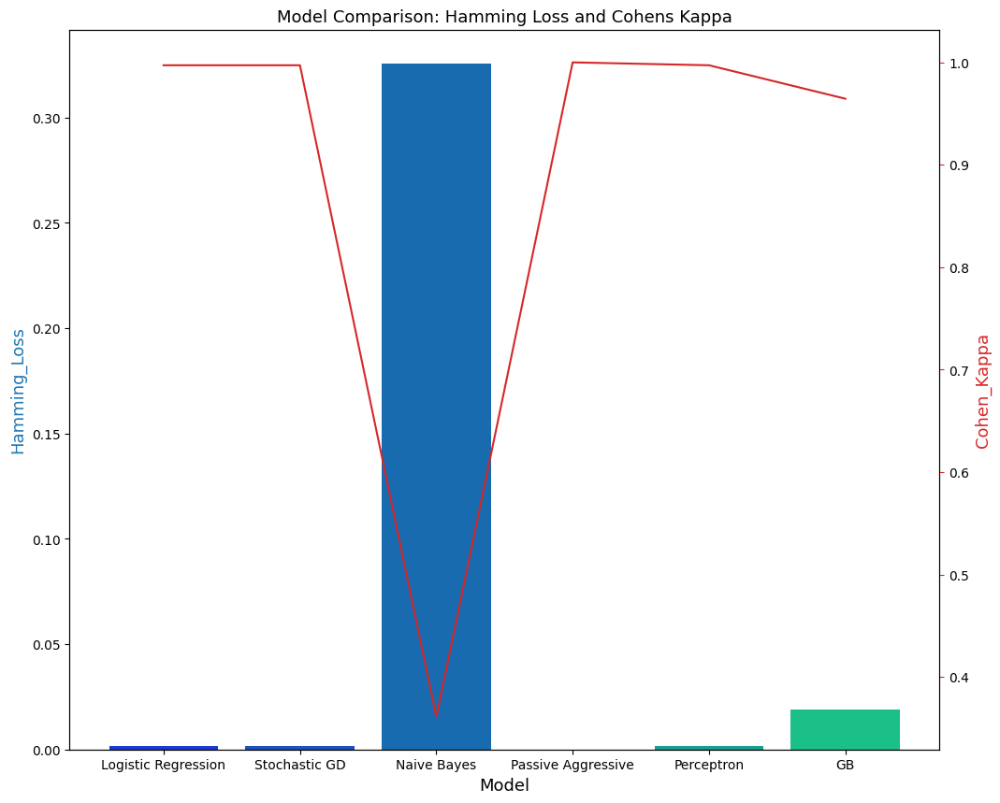

In [ ]:
fig, ax3 = plt.subplots(figsize=(12,10))
ax3.set_title('Model Comparison: Hamming Loss and Cohens Kappa', fontsize=13)
color = 'tab:blue'
ax3.set_xlabel('Model', fontsize=13)
ax3.set_ylabel('Hamming_Loss', fontsize=13, color=color)
ax4 = sns.barplot(x='Model', y='Hamming_Loss', data = data, palette='winter')
ax3.tick_params(axis='y')
ax4 = ax3.twinx()
color = 'tab:red'
ax4.set_ylabel('Cohen_Kappa', fontsize=13, color=color)
ax4 = sns.lineplot(x='Model', y='Cohen_Kappa', data = data, sort=False, color=color)
ax4.tick_params(axis='y', color=color)
plt.show()

***Passive Aggressive classifier*** has zero hinge loss and the highest Cohen's Kappa. Hence, this is the ***best performing model*** applicable on exoplanet habitability classificaion data set.

# Experimenting with Unsupervised Learning :

We will remove the habitability labels from the data set first. Then we will apply K-Means clustering model to cross-check whether it is giving rise to three distinct clusters or not.

In [ ]:
working_data_unsup = working_data.drop(['P_HABITABLE'], axis=1)

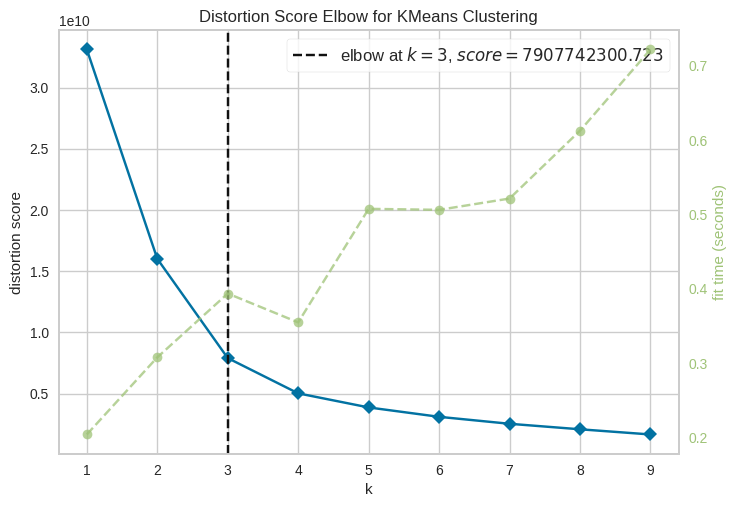

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
#Plotting Elbow Curve
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn import metrics

model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,10))
visualizer.fit(working_data_unsup)
visualizer.poof()

Yes, we got 3 clusters as the ideal number. Now, we will fit data into the K-Means model to get the cluster centers.

In [ ]:
#Fitting data into K-Means model with 3 clusters
km_3 = KMeans(n_clusters=3,random_state=12345)
km_3.fit(working_data_unsup)
print(km_3.cluster_centers_)

[[ 5.12073613e+02  2.01566148e+03  1.74807672e+02  4.28171066e+01
   1.68333478e-01 -1.12089321e-02  9.77717989e-03  8.26604582e-02
   8.14722654e+00  2.56246760e+00  1.93280585e+02 -2.79126826e+01
   1.92163117e+01  3.75790565e-01 -3.87518879e-02  3.74887309e-02
   5.20999749e-01 -3.47033297e-02  3.97618815e-02  2.24379471e+02
  -1.77756661e+00 -5.68931950e-02  5.17483217e-02  3.45972066e+03
   4.80737688e+00  9.50933861e-01  2.64990169e+02  2.55718515e+02
   2.76252662e+02  4.38102644e+00  4.99481597e+00  3.35507880e+03
   3.19319150e-01  9.75635044e-01  5.72835666e-01  1.97459824e+00
   4.66241576e+01  6.68351477e+01]
 [ 2.85822932e+03  2.01622085e+03  1.80376683e+02  9.69976996e+01
   3.37186118e-01 -9.87361447e-02  2.15144240e-01  2.43882405e-02
   8.99846095e+00  7.00269334e-02  2.83698332e+02  4.16655860e+01
   3.63613676e+02  5.95629088e-01 -3.20446283e-02  2.98492431e-02
   5.75128896e-01 -2.84637432e-02  3.09504734e-02  2.44394767e+02
  -1.11923971e+00 -6.64218050e-02  6.5398

In [ ]:
pd.Series(km_3.labels_).value_counts()

1    2599
2    2045
0    1929
dtype: int64

We got 1929 unhabitable, 2599 conservatively habitable and 2045 optimistically habitable exoplanets.

In [ ]:
# calculate Silhouette Coefficient for K=3
from sklearn import metrics
metrics.silhouette_score(working_data_unsup, km_3.labels_)

0.5725851003053689

In [ ]:
cluster_labels = km_3.fit_predict(working_data)

Next, we will label each data point with its appropriate cluster type (0,1,2) respectively. We will store the labels in a newly added column **"KM_Clusters"** in the dataframe.

In [ ]:
# Prediction
preds = km_3.labels_
data_df = pd.DataFrame(working_data_unsup)
data_df['KM_Clusters'] = preds
data_df.head(10)

,P_NAME,P_YEAR,P_UPDATED,P_PERIOD,P_SEMI_MAJOR_AXIS,P_SEMI_MAJOR_AXIS_ERROR_MIN,P_SEMI_MAJOR_AXIS_ERROR_MAX,P_ECCENTRICITY,P_DETECTION,P_DETECTION_MASS,...,P_TYPE,S_TYPE_TEMP,S_DEC_T,S_TIDAL_LOCK,P_HABZONE_OPT,P_HABZONE_CON,P_TYPE_TEMP,S_CONSTELLATION,S_CONSTELLATION_ENG,KM_Clusters
72,72.0,2020.0,228.0,2.290700,0.01850,-0.00130,0.00130,0.096753,8.0,3.0,...,4.0,5.0,130.0,0.233230,0.0,0.0,1.0,20.0,85.0,0
147,147.0,2016.0,186.0,21.170196,0.11950,-0.02510,0.01000,0.060000,9.0,0.0,...,4.0,5.0,352.0,0.293287,0.0,0.0,1.0,11.0,18.0,1
170,170.0,2021.0,238.0,2.305380,0.02279,-0.00061,0.00061,0.096753,8.0,3.0,...,5.0,5.0,2758.0,0.308834,0.0,0.0,1.0,19.0,12.0,0
171,171.0,2021.0,238.0,8.051800,0.05250,-0.00140,0.00140,0.096753,8.0,3.0,...,4.0,5.0,2758.0,0.308834,0.0,0.0,1.0,19.0,12.0,0
172,172.0,2019.0,223.0,5.746007,0.03850,-0.00530,0.00780,0.000000,9.0,0.0,...,4.0,5.0,420.0,0.346974,0.0,0.0,1.0,11.0,18.0,0
182,182.0,2018.0,208.0,3.651100,0.02600,-0.00100,0.00100,0.040000,8.0,3.0,...,4.0,5.0,3142.0,0.260481,0.0,0.0,1.0,3.0,83.0,0
191,191.0,2014.0,152.0,17.133000,0.09200,-0.00300,0.00300,0.070000,8.0,3.0,...,4.0,5.0,3143.0,0.348209,0.0,0.0,1.0,35.0,60.0,0
199,199.0,2020.0,231.0,14.238000,0.08180,-0.00120,0.00110,0.100000,8.0,3.0,...,4.0,5.0,560.0,0.328185,0.0,0.0,1.0,37.0,80.0,0
204,204.0,2020.0,221.0,11.949000,0.07900,-0.00300,0.00300,0.220000,8.0,3.0,...,4.0,5.0,3733.0,0.358688,0.0,0.0,1.0,63.0,58.0,0
207,207.0,2017.0,190.0,5.974000,0.05700,-0.00100,0.00100,0.110000,8.0,3.0,...,4.0,5.0,3117.0,0.405684,0.0,0.0,1.0,20.0,85.0,0


We will now choose some random pairs of features to visualize three distinct clusters.

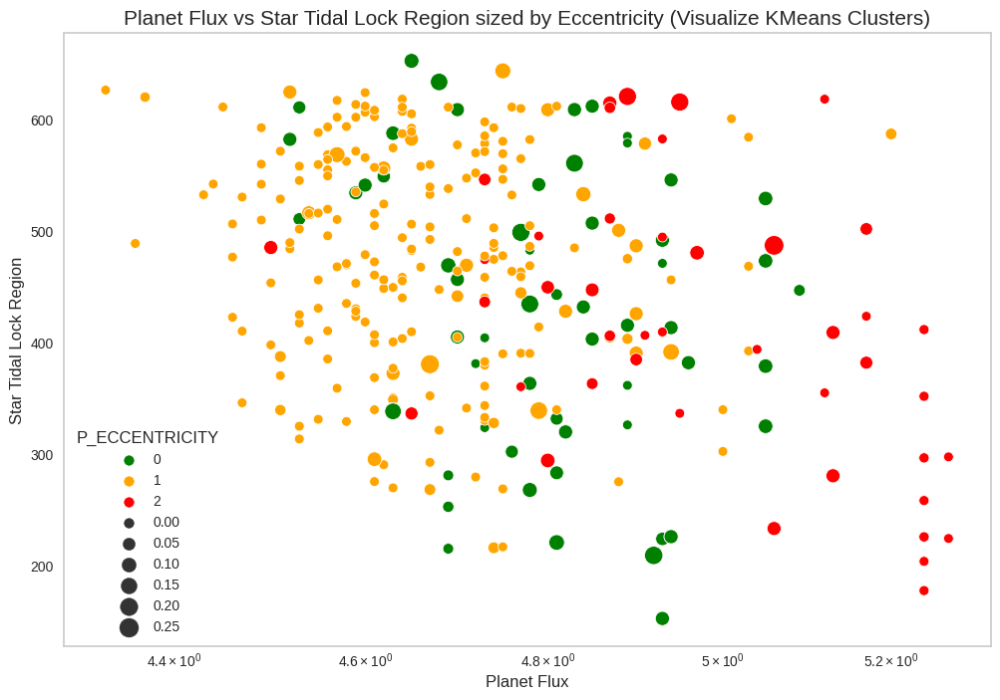

In [ ]:
#Visualize clusters: Feature Pair-1
import seaborn as sns
plt.rcParams['axes.facecolor'] = 'white'
plt.figure(figsize=(12,8))
#Planet Flux vs Star Tidal Lock Region
g =sns.scatterplot(x=working_data_unsup.iloc[:,24], y=working_data_unsup.iloc[:,28],
              hue=cluster_labels,
              data=working_data_unsup,
              palette=['green','orange','red'], edgecolor='white', size='P_ECCENTRICITY', sizes=(50,200));
g.set(xscale="log");
g.grid(False)
plt.title("Planet Flux vs Star Tidal Lock Region sized by Eccentricity (Visualize KMeans Clusters)", fontsize=15)
plt.xlabel("Planet Flux", fontsize=12)
plt.ylabel("Star Tidal Lock Region", fontsize=12)
plt.rcParams['axes.facecolor'] = 'white'
plt.show()

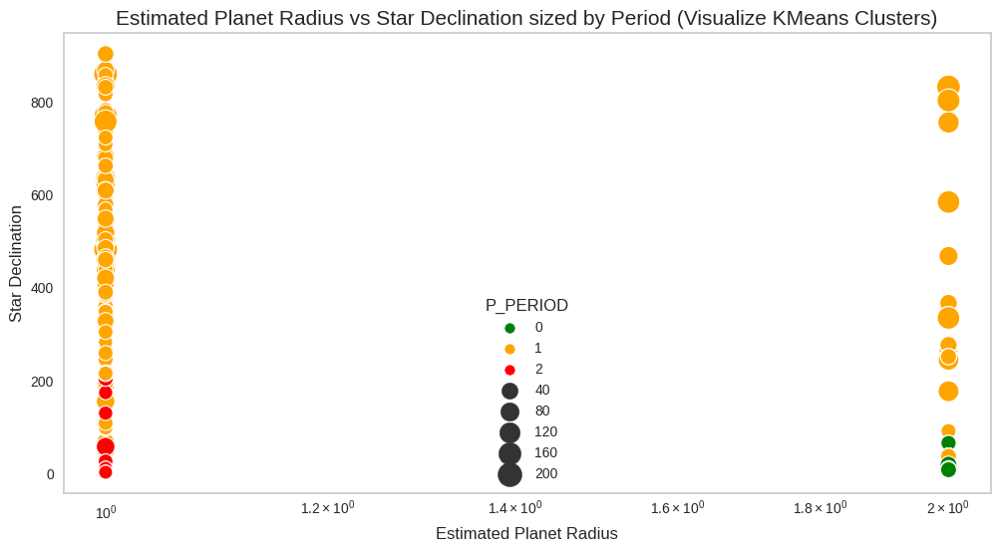

In [ ]:
#Visualize clusters: Feature Pair-2
plt.rcParams['axes.facecolor'] = 'white'
plt.figure(figsize=(12,6))
#Estimated Planet Radius vs Star Declination
g =sns.scatterplot(x=working_data_unsup.iloc[:,35], y=working_data_unsup.iloc[:,12],
              hue=cluster_labels,
              data=working_data_unsup,
              palette=['green','orange','red'], size='P_PERIOD', sizes=(100,300));
g.set(xscale="log");
g.grid(False)
plt.title("Estimated Planet Radius vs Star Declination sized by Period (Visualize KMeans Clusters)", fontsize=15)
plt.xlabel("Estimated Planet Radius", fontsize=12)
plt.ylabel("Star Declination", fontsize=12)
plt.rcParams['axes.facecolor'] = 'white'
plt.show()

Well, we found very clearly distinguishable three observable clusters in both of these pictures above. Hence, we can conclude that the labels marked by K-Means algorithm are credible enough.

In [ ]:
#Export KMeans results to file
data_df.to_csv("KMeans_results.csv", index = False)
print("Submission successful")

Submission successful


In [ ]:
habitable_planets = set(full_data[(full_data['P_HABITABLE']==1) | (full_data['P_HABITABLE']==2)]['P_NAME'])

In [ ]:
inhabitants_data = pd.read_csv('/content/Exoplanets_Inhabitants.csv')

In [ ]:
inhabitants_data.head()

,Planet,Limbs,Hands,Heads,Eyes,Ears,Mouths,Necks
0,GJ 1061 c,6,2,1,4,2,1,1
1,GJ 1061 d,8,4,2,6,2,2,1
2,GJ 163 c,10,5,3,8,3,3,2
3,GJ 180 c,4,2,1,2,1,1,1
4,GJ 180 d,6,3,2,4,2,2,1


In [ ]:
columns = list(working_data.columns)
new_columns = []
for i in columns:
    if i!='P_HABITABLE':
        new_columns.append(i)
columns = new_columns

In [ ]:
habitable_planet_data = full_data[(full_data['P_HABITABLE']==1) | (full_data['P_HABITABLE']==2)]
habitable_planet_data = habitable_planet_data[columns]
habitable_planet_data = habitable_planet_data.rename(columns={"P_NAME": "Planet"})

In [ ]:
inhabitants_data = pd.merge(habitable_planet_data, inhabitants_data, on=['Planet'])

In [ ]:
inhabitants_data

,Planet,P_YEAR,P_UPDATED,P_PERIOD,P_SEMI_MAJOR_AXIS,P_SEMI_MAJOR_AXIS_ERROR_MIN,P_SEMI_MAJOR_AXIS_ERROR_MAX,P_ECCENTRICITY,P_DETECTION,P_DETECTION_MASS,...,P_TYPE_TEMP,S_CONSTELLATION,S_CONSTELLATION_ENG,Limbs,Hands,Heads,Eyes,Ears,Mouths,Necks
0,GJ 1061 c,2020.0,2020-03,6.689000,0.03500,-0.00100,0.00100,0.29000,Radial Velocity,Msini,...,Warm,Horologium,Pendulum Clock,6,2,1,4,2,1,1
1,GJ 1061 d,2020.0,2020-03,13.031000,0.05400,-0.00100,0.00100,0.53000,Radial Velocity,Msini,...,Warm,Horologium,Pendulum Clock,8,4,2,6,2,2,1
2,GJ 163 c,2013.0,2013-08,25.630580,0.12540,-0.00010,0.00010,0.09900,Radial Velocity,Msini,...,Warm,Dorado,Goldfish,10,5,3,8,3,3,2
3,GJ 180 c,2014.0,2014-06,24.329000,0.12900,-0.01700,0.00700,0.09000,Radial Velocity,Msini,...,Warm,Eridanus,River,4,2,1,2,1,1,1
4,GJ 180 d,2020.0,2020-01,106.300000,0.30900,-0.01000,0.01000,0.14000,Radial Velocity,Msini,...,Warm,Eridanus,River,6,3,2,4,2,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,TRAPPIST-1 f,2017.0,2016-05,9.207540,0.03849,-0.00033,0.00033,0.01007,Transit,Mass,...,Warm,Aquarius,Water Carrier,14,7,4,12,5,4,3
57,TRAPPIST-1 g,2017.0,2016-05,12.352446,0.04683,-0.00040,0.00040,0.00208,Transit,Mass,...,Warm,Aquarius,Water Carrier,8,4,2,6,2,2,1
58,Teegarden's Star b,2019.0,2019-07,4.910000,0.02520,-0.00090,0.00080,0.00000,Radial Velocity,Msini,...,Warm,Aries,Ram,6,3,2,4,2,2,1
59,Teegarden's Star c,2019.0,2019-07,11.409000,0.04430,-0.00150,0.00140,0.00000,Radial Velocity,Msini,...,Warm,Aries,Ram,8,4,2,6,2,2,1


In [ ]:
inhabitants_data.dtypes

Planet                          object
P_YEAR                         float64
P_UPDATED                       object
P_PERIOD                       float64
P_SEMI_MAJOR_AXIS              float64
P_SEMI_MAJOR_AXIS_ERROR_MIN    float64
P_SEMI_MAJOR_AXIS_ERROR_MAX    float64
P_ECCENTRICITY                 float64
P_DETECTION                     object
P_DETECTION_MASS                object
S_RA                           float64
S_DEC                          float64
S_DISTANCE                     float64
S_MASS                         float64
S_MASS_ERROR_MIN               float64
S_MASS_ERROR_MAX               float64
S_RADIUS                       float64
S_RADIUS_ERROR_MIN             float64
S_RADIUS_ERROR_MAX             float64
S_TYPE                          object
S_LOG_LUM                      float64
S_LOG_LUM_ERROR_MIN            float64
S_LOG_LUM_ERROR_MAX            float64
S_TEMPERATURE                  float64
S_LOG_G                        float64
P_FLUX                   